In [45]:
import pandas as pd
import matplotlib.pyplot as plt

from collections import defaultdict

from pathlib import Path

In [46]:
discharge_coverage_path = Path("~/BA/data/processed_data/eda/discharge_coverage.pkl")

discharge_coverage = pd.read_pickle(discharge_coverage_path)

##### Visualize normal periods for a subsample of basins. 

Basin 55 is the odd one out, it shows systematic gaps, and is therefore not usable.

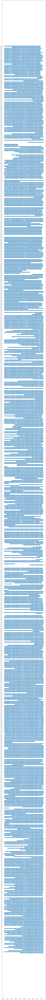

In [48]:
fig, ax = plt.subplots(figsize=(10, len(discharge_coverage) * 0.25))

yticks = []
yticklabels = []

# Test pickling. 
train_dict = defaultdict(dict)
val_dict = defaultdict(dict)
test_dict = defaultdict(dict)

for basin in discharge_coverage.itertuples():

    basin_dict = {
        "start_dates": [],
        "end_dates" : []
    }
    normal_periods = []

    for period in basin[-2]: 

        x_min = period[0]
        x_width = (period[1] - period[0])

        normal_periods.append((x_min,x_width))

        # Attach for pickling. 
        basin_dict["start_dates"].append(period[0])
        basin_dict["end_dates"].append(period[1])

    ax.broken_barh(
        xranges=normal_periods,
        yrange=(len(yticks), 0.5)
    )

    basin_id = basin[0]

    if basin_id < 600:
        train_dict[str(basin_id)] = basin_dict
    elif basin_id < 750: 
        val_dict[str(basin_id)] = basin_dict
    else: 
        test_dict[str(basin_id)] = basin_dict

    yticks.append(len(yticks))
    yticklabels.append(basin[0])

ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)

plt.tight_layout()
plt.show()

In [49]:
train_dict

defaultdict(dict,
            {'1': {'start_dates': [Timestamp('1996-01-01 00:00:00'),
               Timestamp('1996-07-10 00:00:00'),
               Timestamp('1997-06-14 00:00:00'),
               Timestamp('1997-06-24 00:00:00'),
               Timestamp('1997-07-03 00:00:00'),
               Timestamp('1997-07-09 00:00:00'),
               Timestamp('1997-07-12 00:00:00'),
               Timestamp('1997-07-19 00:00:00'),
               Timestamp('1998-06-09 00:00:00'),
               Timestamp('1998-06-12 00:00:00'),
               Timestamp('1998-09-13 00:00:00'),
               Timestamp('1999-06-23 00:00:00'),
               Timestamp('1999-07-10 00:00:00'),
               Timestamp('1999-07-15 00:00:00'),
               Timestamp('1999-08-11 00:00:00'),
               Timestamp('1999-09-22 00:00:00'),
               Timestamp('1999-10-02 00:00:00'),
               Timestamp('1999-10-05 00:00:00'),
               Timestamp('2000-05-06 00:00:00'),
               Timestamp('2000-

In [53]:
print(train_dict.__repr__())

defaultdict(<class 'dict'>, {'1': {'start_dates': [Timestamp('1996-01-01 00:00:00'), Timestamp('1996-07-10 00:00:00'), Timestamp('1997-06-14 00:00:00'), Timestamp('1997-06-24 00:00:00'), Timestamp('1997-07-03 00:00:00'), Timestamp('1997-07-09 00:00:00'), Timestamp('1997-07-12 00:00:00'), Timestamp('1997-07-19 00:00:00'), Timestamp('1998-06-09 00:00:00'), Timestamp('1998-06-12 00:00:00'), Timestamp('1998-09-13 00:00:00'), Timestamp('1999-06-23 00:00:00'), Timestamp('1999-07-10 00:00:00'), Timestamp('1999-07-15 00:00:00'), Timestamp('1999-08-11 00:00:00'), Timestamp('1999-09-22 00:00:00'), Timestamp('1999-10-02 00:00:00'), Timestamp('1999-10-05 00:00:00'), Timestamp('2000-05-06 00:00:00'), Timestamp('2000-05-14 00:00:00'), Timestamp('2000-05-20 00:00:00'), Timestamp('2000-06-08 00:00:00'), Timestamp('2000-06-16 00:00:00'), Timestamp('2000-07-26 00:00:00'), Timestamp('2000-08-10 00:00:00'), Timestamp('2000-10-17 00:00:00'), Timestamp('2001-05-16 00:00:00'), Timestamp('2001-05-20 00:00:00'

In [58]:
import pickle as pkl

splits_directory_path = Path("/home/wuhlmann/BA/data/processed_data/test_splits")

with open(splits_directory_path / "train.pkl", "wb") as out: 
    pkl.dump(train_dict, out, protocol=pkl.HIGHEST_PROTOCOL)

with open(splits_directory_path / "val.pkl", "wb") as out: 
    pkl.dump(val_dict, out, protocol=pkl.HIGHEST_PROTOCOL)

with open(splits_directory_path / "test.pkl", "wb") as out: 
    pkl.dump(test_dict, out, protocol=pkl.HIGHEST_PROTOCOL)


In [60]:
with open(splits_directory_path / "train_basin_ids.txt", "w") as f: 
    for id in train_dict.keys():
        f.write(f"{id}\n")

with open(splits_directory_path / "val_basin_ids.txt", "w") as f: 
    for id in val_dict.keys():
        f.write(f"{id}\n")

with open(splits_directory_path / "test_basin_ids.txt", "w") as f: 
    for id in test_dict.keys():
        f.write(f"{id}\n")